<a href="https://colab.research.google.com/github/jmestanza/time_stretching/blob/master/refactor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%cd /content
from IPython.display import clear_output

#imports
#!pip install librosa
!pip install webrtcvad
import webrtcvad
!pip install --upgrade librosa
import librosa 
import scipy
import numpy as np
from IPython.display import Audio
import matplotlib.pyplot as plt
from math import ceil 
import matplotlib.patches as mpatches

#local modules
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/detect_pitch.py
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/modified_psola_op.py
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/vad.py
!wget https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/utils.py
#audios
!wget "https://raw.githubusercontent.com/vicaub/Pitch-Estimation-and-Voicing-Detection/master/data/fda_ue/rl047.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/harry_potter_es.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/hunger_games_en.wav"
!wget "https://raw.githubusercontent.com/jmestanza/time_stretching/master/code/input/shh.wav"

clear_output()

In [0]:
from modified_psola_op import modified_psola
from detect_pitch import get_fundamental_frequency
from vad import float2pcm, pcm2float, frame_generator, join_vad_frames, get_vad_frames
from vad import Frame
from scipy import signal
from utils import *

clear_output()

## Escuchamos el input

In [3]:
fs = 48000

audio = "/content/hunger_games_en.wav"
Audio(data=audio, rate=fs)

In [0]:
def lpc_filtering(regions_lpc, audio_f, audio_noised, coef_number): 
    lpc_coeffs = []
    error = []
    for start, end in regions_lpc:
        a = librosa.lpc(audio_noised[start:end], coef_number)
        lpc_coeffs.append(a)
        error.extend(scipy.signal.lfilter(a, [1], audio_f[start:end]))
    error = np.array(error)
    return error, lpc_coeffs

def process_error(e, K, L, fs,p_pk,p_s,speed,is_voiced,regions):
    f0_idx,f0 = get_fundamental_frequency(e,is_voiced, K, L, fs)
    get_p = "pitch_variable" # manera asignar ventanas
    m = "2" # modo de asignar los t_ 
    # p_pk = percent_peak
    # p_s = percent_pitch
    unv_samples = 360
    e_, pz, uz = modified_psola(e, f0_idx, f0,p_pk, p_s, speed,is_voiced,regions,get_p,m, unvoiced_samples= unv_samples)
    return e_, f0_idx, f0 , pz, uz

def get_noise_for_lpc(audio_f,std = 0.001):
    noise = np.random.normal(0, std, size=len(audio_f)) # media 0
    return noise+audio_f 


In [0]:
def speed_up(audio_path, speed, sample_rate, T=20*1e-3):
    audio_f, audio_i = get_float_and_int_audio(audio_path,fs) # audio_i lo necesita el VAD
    audio_noised = get_noise_for_lpc(audio_f, std=5e-3) 
    # Relacion de compromiso, picos grandes o error grande en gral
    # se ve en el error 
    K , L = get_K_and_L(T,fs)
    speech, not_speech, is_voiced, frame_len = vad_config(audio_i, fs)

    regions = separate_regions(is_voiced)
    regions_lpc = regions.copy()
    error, lpc_coeffs = lpc_filtering(regions_lpc, audio_f, audio_noised, coef_number=12) 
    percent_pitch = 0.5 # 0.5 o 0.6 anda bien con "pitch variable"  y "2"
    psola_error, f0_idx, f0, pitch_zones, unvoiced_zones =  process_error(error, K, L, fs,0.5,percent_pitch,speed,is_voiced,regions)
    sub_regions = get_regions_in_new_time(regions_lpc,speed, mode= "floor")

    voiced_filt = []            

    for i, sub_reg in enumerate(sub_regions):      
        start, end = sub_reg
        voiced_filt.extend(scipy.signal.lfilter([1], lpc_coeffs[i] , psola_error[start:end]))
    voiced_filt = np.array(voiced_filt)
    
    is_voiced = np.array(is_voiced)
    is_voiced = is_voiced.astype(np.int16)

    return voiced_filt, psola_error, error, audio_f, is_voiced, pitch_zones, unvoiced_zones

periodicidad minima que se puede estimar 100.0 Hz


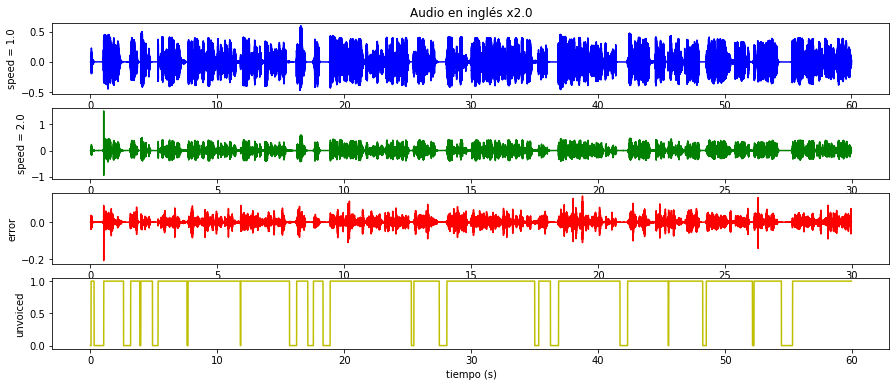

In [6]:
speed = 2.0
audio_final, psola_err, err, audio_original, is_voice, pz, uz = speed_up(audio, speed, fs) # hacemos los primeros 10 segundos
plot_four_signals(audio_original,audio_final,psola_err,is_voice,fs,speed)
Audio(data=audio_final, rate=fs)

9961


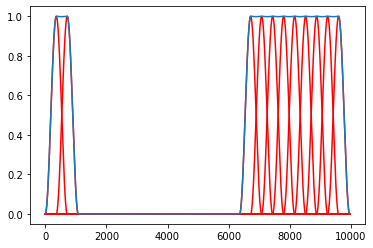

In [7]:
draw_windows(uz,10)

5425


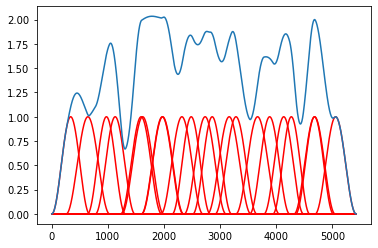

In [8]:
draw_windows(pz,10)

periodicidad minima que se puede estimar 100.0 Hz


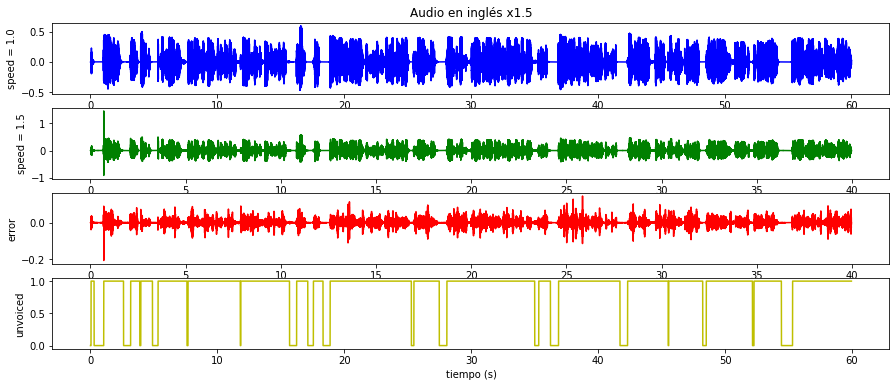

In [9]:
speed = 1.5
audio_final, psola_err, err, audio_original, is_voice, pz, uz = speed_up(audio, speed, fs) # hacemos los primeros 10 segundos
plot_four_signals(audio_original,audio_final,psola_err,is_voice,fs,speed)
Audio(data=audio_final, rate=fs)

11841


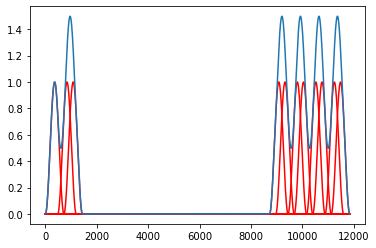

In [10]:
draw_windows(uz,10)

5425


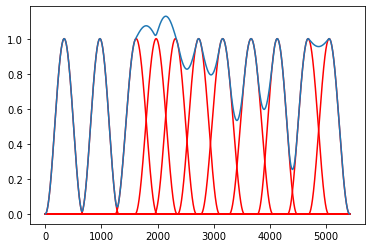

In [11]:
draw_windows(pz,10)

## Vamos a hacer LPC short time 

## Conclusiones hasta ahora

* Filtrado LPC provoca picos extraños en la señal 

* Filtrado LPC SHORT TIME no mejora respecto al que propusimos que era por separacion de regiones sonoras (LPC SHORT TIME toma ventanas)

Como se hizo LPC SHORT TIME:

Filtrado:

Agarre una ventana rectangular, la filtre con el error de prediccion y eso lo puse como error cada 20ms y con overlap de 50%.

Defiltrado del error de psola:

Ventanee con hanning overlap de 50%, la filtre con el inverso del filtro de error de prediccion.

*  Bug de volumen en PSOLA

## Conclusiones hasta ahora 2 
filtrado LPC provocaba picos extraños en la señal y además introducía un cambio en el volumen.

Para solucionar esto, añadimos un parámetro de regularización por medio de añadir ruido blanco al audio, regulando la varianza pudimos mejorar esta condición de LPC. 

## Conclusiones hasta ahora 3
habia un bug en regions

## Conclusiones hasta ahora 4
* Quedo arreglado el bug en regions (no las tiraba bien y por alguna razon daba algo que parecia estar bien)

* Quedo arreglado el bug de que iba subiendo el volumen (era que las ventanas no sonoras no sumaban 1)

* Se puede arreglar los picos en la señal error ajustando la varianza del ruido blanco gaussiano añadido al audio para filtrar LPC. OJO: Se obtienen los coeficientes con el ruido pero se filtra el original (o sea sin ruido).

# Aclaraciones sobre PSOLA
Hice un par de pruebas con psola. 

Actualmente en PSOLA hay dos formas de agarrar ventanas segun el pitch. 
## como son las ventanas para los distintos pitch
Originalmente estaba puesto para que busque los picos en la señal error y que a una cantidad constante de muestras a izquierda y derecha. Esto vi que no tiene buenos resultados dado que el pitch va cambiando. A esto llame **"pitch_cte" en modified_psola.**

Entonces lo tuve que cambiar para que se vaya adaptando al pitch la ventana. Es por esta razon que al ser ventanas de tamaño variable muy probablemente no sumen 1 (Antes no lo hacian a menos que sea pitch cte, lo cual es muy poco probable). A esta configuración la llame **"pitch_variable" en modified_psola.**



## Modo "1" y Modo "2"

Por otro lado **en modified_psola hay un modo "1" o "2"**, que tiene que ver con como se recalculan los tiempos y distancias cuando el tiempo es reducido. 
Ejemplo en speed = 1.5 = 3/2
Sabemos que en cualquier caso agarramos 2 ventanas cada 3.
Lo que varia en los metodos son los tiempos que asigno a las ventanas que tomo.

En "1":
* fijo primer t_= tpico1/speed 
* next_t = t_ + dist(pico1,pico2) // la distancia es en t original no en t_
* // como descarto la tercer ventana no computo dist(pico2,pico3)
* next_t = t_ + dist(pico1,pico2) + dist(pico3,pico4) 
* // dist(pico3,pico4) puede ser vista como lo que le falta al primer
* // conjunto de ventanas para llegar al segundo conjunto
* etc...

En "2":
* fijo primer t_ = tpico1/speed 
* next_t = t_ + dist(pico1,pico2) // la distancia es en t original no en t_
* // como descarto la tercer ventana no computo dist(pico2,pico3)
* fijo "siguiente"  t_ = tpico4/speed // "resincronizo"
* next_t = t_  + dist(pico4,pico5)
* etc...





## "percent pitch"

Esta variable maneja cuanto porcentaje del pitch agarra la ventana. Es decir si
ponemos 0.1, por cada ventana que haya (sea de tamaño variable o no), va a actualizar las muestras tomadas tanto para la izquierda como a la derecha en un factor *0.1. 
Ejemplo: Si originalmente tomo 100 a la izquierda y 100 a la derecha, al pasar este parametro, voy a tomar 10 a la izquierda y 10 a la derecha. Este factor es para poder tener un manejo de las ventanas, para poder acercarme lo mas posible a la condicion OLA.


Lo que determinó qué método se va a utilizar es básicamente que metodo presentaba ventanas menos conflictivas en el sentido de cumplir la condicion OLA (aunque sabemos que muy probablemente no se pueda)


Frente a estas modalidades, hay fotos sobre las pruebas que hice en [code/imagenes_nuevas
](https://github.com/jmestanza/time_stretching/tree/master/code/dibujos%20y%20graficos/imagenes_nuevas)

Lo que mejores resultados presento fue:
En general modo "2" daba mejores resultados.
Uno en particular que es aceptable es:

**pitch_variable con pitch_percent = 0.5 y modo "2"**

# Otros parametros configurables

## Regularizacion
En la funcion speed_up


```
audio_noised = get_noise_for_lpc(audio_f, std=1e-3)
```
std hace el juego de parametro de regularizacion para el lpc por regiones que se realiza



##Como se buscan los picos de la señal error 
### peak_percent
... =  process_error(error, K, L, fs,**peak_percent**,percent_pitch,speed,is_voiced,regions)

En la funcion modified_psola existe un parametro peak_percent que lo que hace es basicamente agarra un histograma de los pitches que salieron en la region sonora y se queda con el de maxima probabilidad.
Cuando se va a buscar picos, es importante setear una distancia minima para no tener picos absurdos. Es por eso que se setea una distancia minima de:

```
min_dist = max_prob_pitch-max_prob_pitch*peak_percent
```
Y se la pasa a la funcion scipy.signal.find_peaks


## Tamaño de las ventanas a usar en la autocorrelacion short time modificada
* W1 es de tamaño L
* W2 es de tamaño K+L

la maxima periodicidad detectable (segun filminas) es fs/K
para mi podria ser fs/(K+L)  pero **ni idea**


# Tamaño de las ventanas en regiones no sonoras
modified_psola recibe como parametro unvoiced_samples lo cual equivale al tamaño a usar para alguno de los lados (por ejemplo derecha), por lo cual define una ventana de 2*unvoiced_samples+1

supongo que habria que poner algo relacionado a 20ms

# Cantidad de coeficientes LPC
Usamos 12, no lo cambiaria porque creo que no mejoraba cuando lo cambiaba (A chequear)